In [1]:
#coding=utf-8
################################################
# 数据增广
################################################
import numpy as np
import os
import cv2
import copy
import glob
import matplotlib.pyplot as plt



class DataAugment:
    def __init__(self,debug=False):
        self.debug=debug
        print("Data augment...")

    def show(self,img):
        """可视化"""
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        key = cv2.waitKey(0)
        if key == 27:
            destoryAllWindows()

    def random_transform(self,img,min_translation,max_translation):
        """平移变换（倒映填充）"""
        factor=self.random_vector(min_translation,max_translation)
        trans_matrix=np.array([[1, 0, factor[0]],[0, 1, factor[1]],[0, 0, 1]])
        out_img=self.apply(img,trans_matrix)
        return trans_matrix, out_img

    def transform(self,img,h,w):
        """平移变换"""
        rows,cols,channel = img.shape
        M = np.float32([[1,0,w],[0,1,h]])
        transform = cv2.warpAffine(img,M,(cols,rows))
        return transform
    
    def random_rotate(self,img,factor):
        """随机旋转"""
        angle=np.random.uniform(factor[0],factor[1])
        print("angle:{}".format(angle))
        rotate_matrix=np.array([[np.cos(angle), -np.sin(angle), 0],[np.sin(angle), np.cos(angle), 0],[0, 0, 1]])
        out_img=self.apply(img,rotate_matrix)
        return rotate_matrix, out_img    

    def random_shear(self,img,factor):
        """随机剪切，包括横向和众向剪切"""
        angle = np.random.uniform(factor[0], factor[1])
        print("fc:{}".format(angle))
        crop_matrix = np.array([[1, factor[0], 0], [factor[1], 1, 0], [0, 0, 1]])
        out_img=self.apply(img,crop_matrix)
        return crop_matrix, out_img
    
    def center_crop(self,img, crop_h, crop_w):
        """对图像进行中心化crop处理"""
        if crop_w is None:
            crop_w = crop_h
        h, w = img.shape[:2]
        j = int((h - crop_h)/2.)
        i = int((w - crop_w)/2.)
        img_crop = img[j:j+crop_h, i:i+crop_w]
        #plt.imshow(img_crop)
        #plt.axis('off')
        #plt.show()
        #key = cv2.waitKey(0)
        #if key == 27:
            #destoryAllWindows()
        
        return img_crop
    
    def color_shift(self,img):
        """色彩变换"""
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)#RGB转换为gray
        #cv.imshow("gray",gray)
        hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)#RGB转换为hsv
        #cv.imshow("hsv",hsv)
        yuv = cv2.cvtColor(img,cv2.COLOR_BGR2YUV)#RGB转换为yuv
        #cv.imshow("hsv",yuv)
        Ycrcb = cv2.cvtColor(img,cv2.COLOR_BGR2YCrCb)#RGB转换为Ycrcb
        #cv.imshow("Ycrcb",Ycrcb)
        return gray,hsv,yuv,Ycrcb
    
    def perspective_transform(self,img, factor1, factor2,factor3):
        """透视变换"""
        pts1 = np.float32(factor1)
        pts2 = np.float32(factor2)
        M = cv2.getPerspectiveTransform(pts1,pts2)
        res = cv2.warpPerspective(img,M,factor3)
        
        return res       
    
    def adjust_gamma(img, gamma=2.0):
        """gamma修正，让图像看起来更明亮"""
        invGamma = 1.0/gamma
        table = []
        for i in range(256):
            table.append(((i / 255.0) ** invGamma) * 255)
        table = np.array(table).astype("uint8")
        return cv2.LUT(img, table)
    
    # 随机色彩调节
    def random_light_color(img,a):
        # brightness
        B,G,R = cv2.split(img)

        b_rand = random.randint(-50, 50)
        if b_rand == 0:
            pass
        elif b_rand > 0:
            lim = 255 - b_rand
            B[B > lim] = 255
            B[B <= lim] = (b_rand + B[B <= lim]).astype(img.dtype)
        elif b_rand < 0:
            lim = 0 - b_rand
            B[B < lim] = 0
            B[B >= lim] = (b_rand + B[B >= lim]).astype(img.dtype)

        g_rand = random.randint(-50, 50)
        if g_rand == 0:
            pass
        elif g_rand > 0:
            lim = 255 - g_rand
            G[G > lim] = 255
            G[G <= lim] = (g_rand + G[G <= lim]).astype(img.dtype)
        elif g_rand < 0:
            lim = 0 - g_rand
            G[G < lim] = 0
            G[G >= lim] = (g_rand + G[G >= lim]).astype(img.dtype)

        r_rand = random.randint(-50, 50)
        if r_rand == 0:
            pass
        elif r_rand > 0:
            lim = 255 - r_rand
            R[R > lim] = 255
            R[R <= lim] = (r_rand + R[R <= lim]).astype(img.dtype)
        elif r_rand < 0:
            lim = 0 - r_rand
            R[R < lim] = 0
            R[R >= lim] = (r_rand + R[R >= lim]).astype(img.dtype)

        img_merge = cv2.merge((B, G, R))
        #img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
        return img_merge    
    
    def random_flip(self,img,factor):
        """水平或垂直翻转"""
        flip_matrix = np.array([[factor[0], 0, 0],[0, factor[1], 0],[0, 0, 1]])
        out_img=self.apply(img,flip_matrix)
        return flip_matrix, out_img

    def random_scale(self,img,min_translation,max_translation):
        """随机缩放"""
        factor=self.random_vector(min_translation, max_translation)
        scale_matrix = np.array([[factor[0], 0, 0],[0, factor[1], 0],[0, 0, 1]])
        out_img=self.apply(img,scale_matrix)
        return scale_matrix, out_img

    def random_shear(self,img,factor):
        """随机剪切，包括横向和众向剪切"""
        angle = np.random.uniform(factor[0], factor[1])
        print("fc:{}".format(angle))
        crop_matrix = np.array([[1, factor[0], 0], [factor[1], 1, 0], [0, 0, 1]])
        out_img=self.apply(img,crop_matrix)
        return crop_matrix, out_img
    
    def canny(img):
        """边缘提取"""
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        canny = cv2.Canny(gray,100,200)
        return canny

    def basic_matrix(self,translation):
        """基础变换矩阵"""
        return np.array([[1,0,translation[0]],[0,1,translation[1]],[0,0,1]])

    def adjust_transform_for_image(self,img,trans_matrix):
        """根据图像调整当前变换矩阵"""
        transform_matrix=copy.deepcopy(trans_matrix)
        height, width, channels = img.shape
        transform_matrix[0:2, 2] *= [width, height]
        center = np.array((0.5 * width, 0.5 * height))
        transform_matrix = np.linalg.multi_dot([self.basic_matrix(center), transform_matrix, self.basic_matrix(-center)])
        return transform_matrix

    def apply_transform(self,img,transform):
        """仿射变换"""
        output = cv2.warpAffine(img, transform[:2, :], dsize=(img.shape[1], img.shape[0]),
                                flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT, borderValue=0,)   #cv2.BORDER_REPLICATE,cv2.BORDER_TRANSPARENT
        return output

    def apply(self,img,trans_matrix):
        """应用变换"""
        tmp_matrix=self.adjust_transform_for_image(img, trans_matrix)
        out_img=self.apply_transform(img, tmp_matrix)
        if self.debug:
            self.show(out_img)
        return out_img

    def random_vector(self,min,max):
        """生成范围矩阵"""
        min=np.array(min)
        max=np.array(max)
        print(min.shape,max.shape)
        assert min.shape==max.shape
        assert len(min.shape) == 1
        return np.random.uniform(min, max)



Data augment...
(2,) (2,)


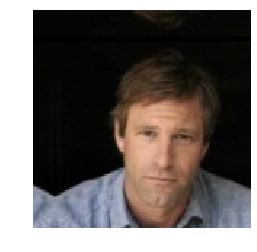

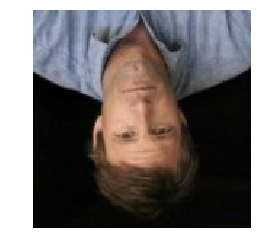

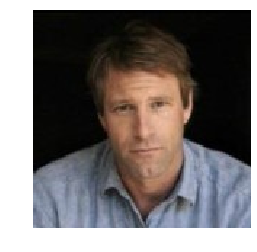

angle:0.7168953242170804


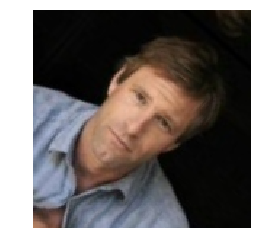

(2,) (2,)


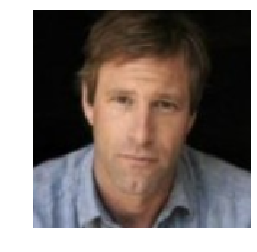

fc:0.20869191449927144


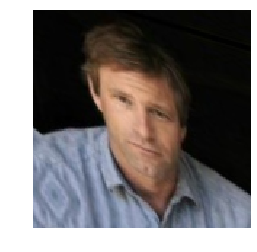

(2,) (2,)


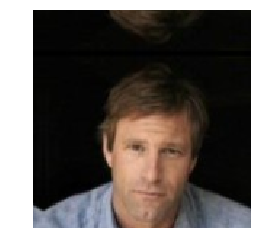

angle:0.5746683027010958


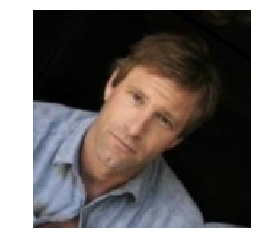

(2,) (2,)


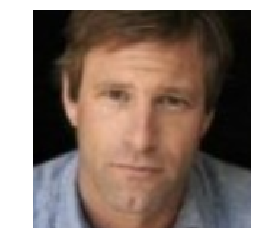

tmp:[[ 1.35171134 -0.86982883  0.04681989]
 [ 0.87533393  1.34321024  0.19831508]
 [ 0.          0.          1.        ]]


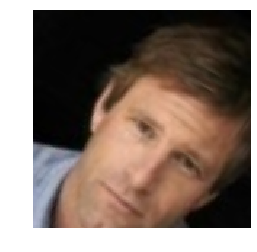

(2,) (2,)


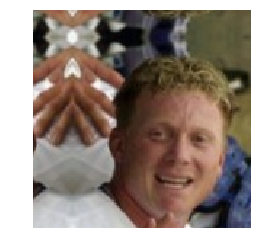

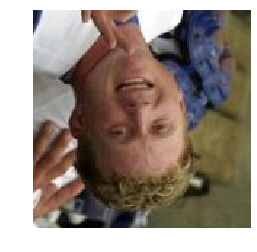

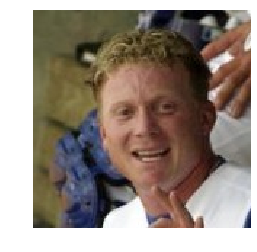

angle:0.5668018145142557


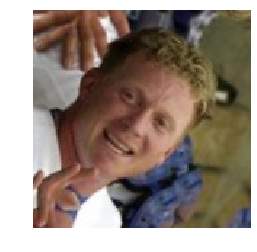

(2,) (2,)


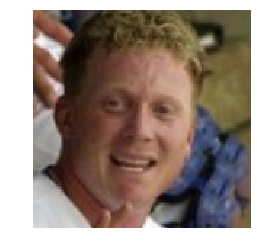

fc:0.29617271195580175


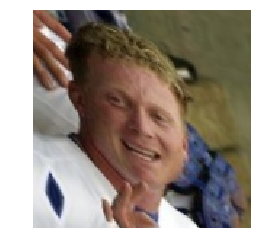

(2,) (2,)


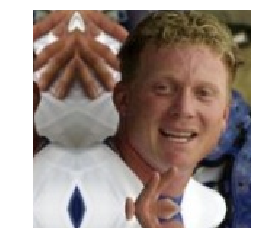

angle:0.6700556349215862


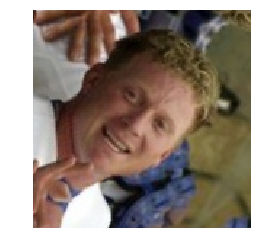

(2,) (2,)


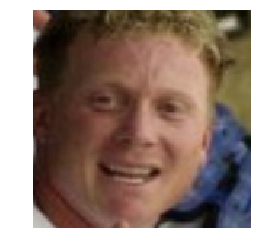

tmp:[[ 1.25750573 -0.95466491  0.20059263]
 [ 0.99637804  1.20486054 -0.08763918]
 [ 0.          0.          1.        ]]


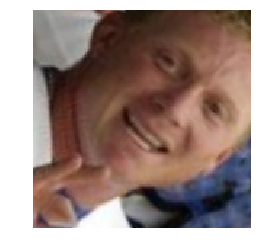

(2,) (2,)


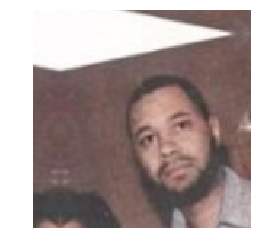

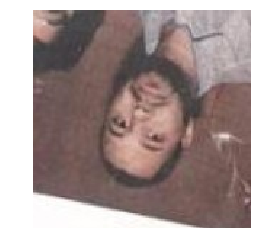

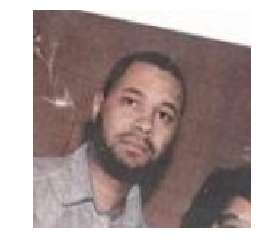

angle:0.6117091120088012


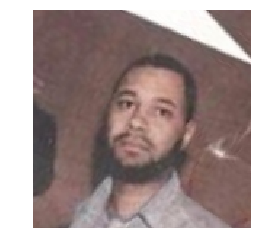

(2,) (2,)


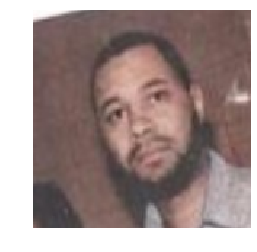

fc:0.21308914989646843


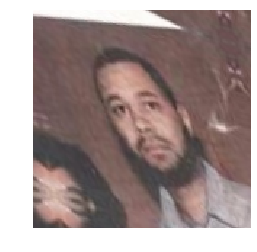

(2,) (2,)


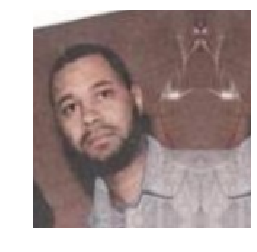

angle:0.5307542819665808


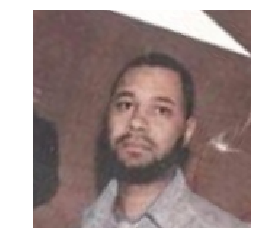

(2,) (2,)


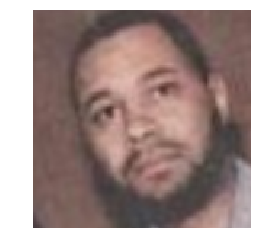

tmp:[[ 1.45545014 -0.83764069 -0.23142587]
 [ 0.85424835  1.42715436 -0.034891  ]
 [ 0.          0.          1.        ]]


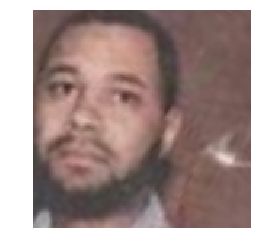

(2,) (2,)


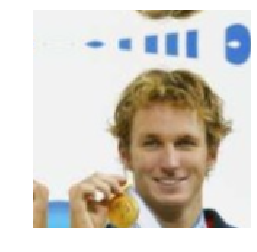

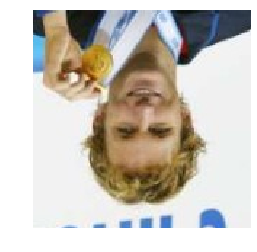

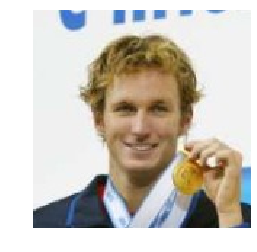

angle:0.7867966126606156


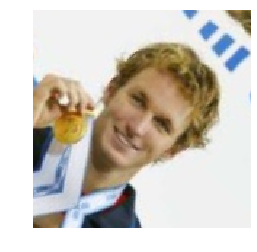

(2,) (2,)


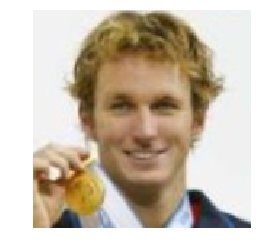

fc:0.2919616636365969


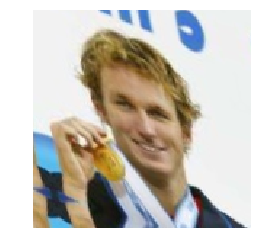

(2,) (2,)


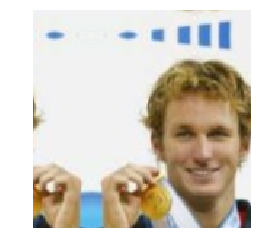

angle:0.5824423259726681


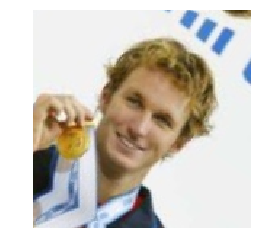

(2,) (2,)


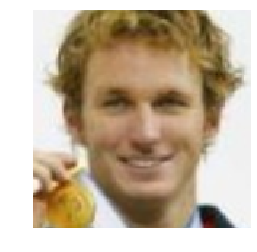

tmp:[[ 1.32777964 -0.8559092   0.26813727]
 [ 0.87456162  1.2994611   0.11591128]
 [ 0.          0.          1.        ]]


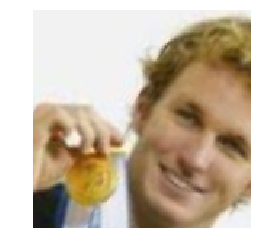

(2,) (2,)


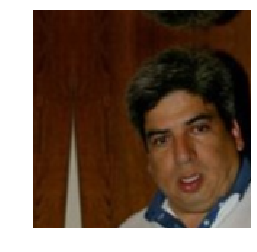

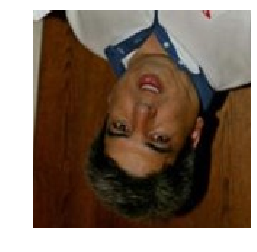

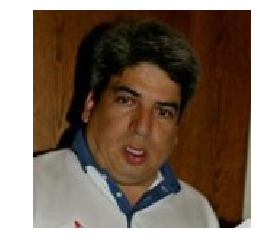

angle:0.7665417084406909


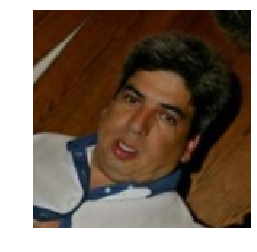

(2,) (2,)


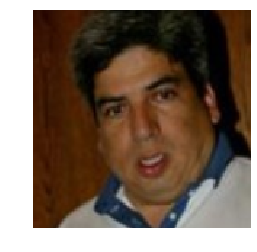

fc:0.2271757368686233


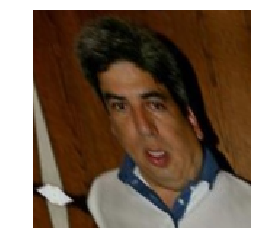

(2,) (2,)


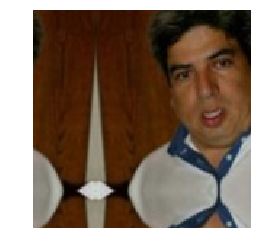

angle:0.6940312704611912


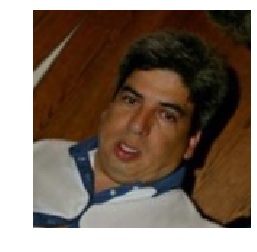

(2,) (2,)


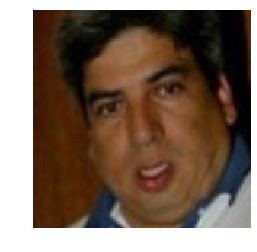

tmp:[[ 1.18320867 -1.0306533   0.28785821]
 [ 0.9845906   1.23856345 -0.17098252]
 [ 0.          0.          1.        ]]


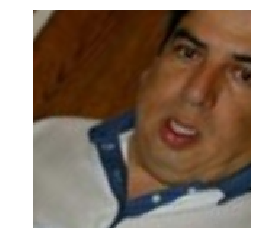

(2,) (2,)


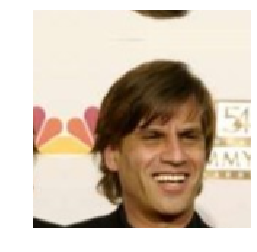

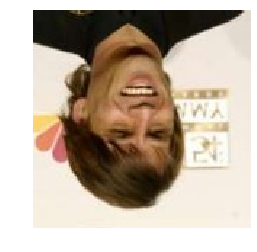

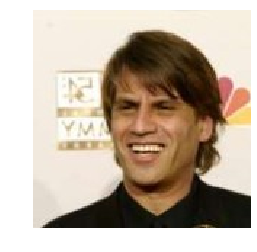

angle:0.6519204761082715


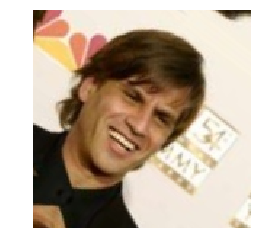

(2,) (2,)


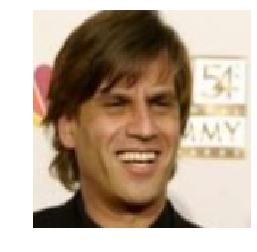

fc:0.20224547754657984


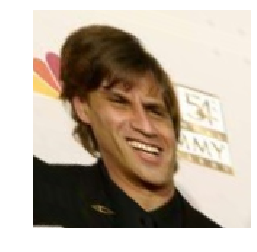

(2,) (2,)


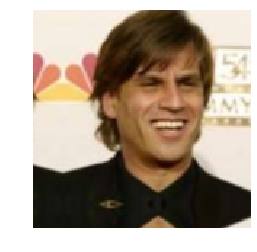

angle:0.7695453359394406


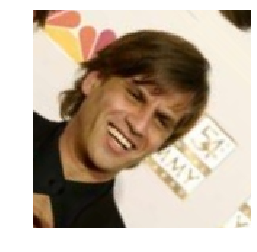

(2,) (2,)


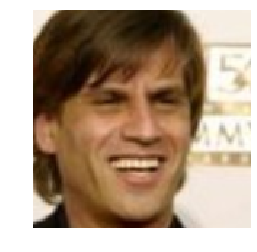

tmp:[[ 1.10479529 -1.07279816  0.13730421]
 [ 1.07031082  1.10736277 -0.10898703]
 [ 0.          0.          1.        ]]


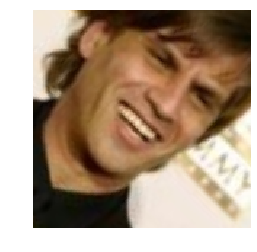

(2,) (2,)


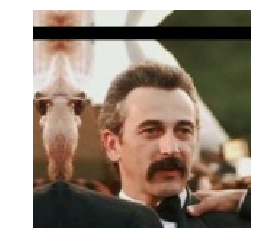

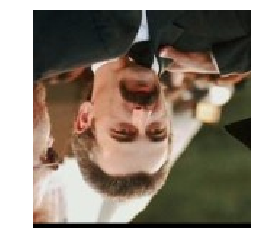

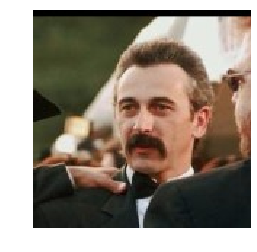

angle:0.5094985106487069


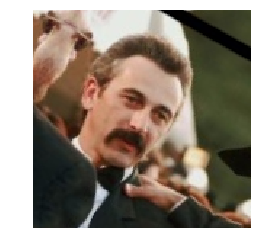

(2,) (2,)


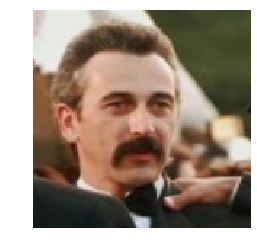

fc:0.28959476859085537


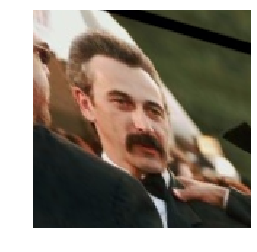

(2,) (2,)


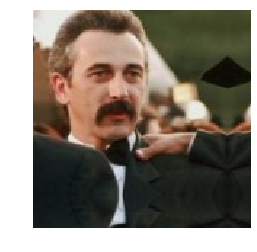

angle:0.5292869367101009


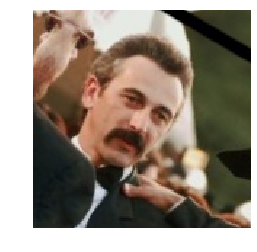

(2,) (2,)


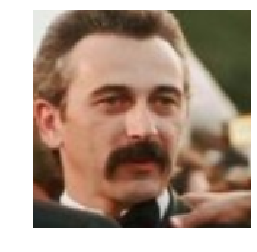

tmp:[[ 1.38880235 -0.77552274 -0.10788858]
 [ 0.8123932   1.32577156 -0.153994  ]
 [ 0.          0.          1.        ]]


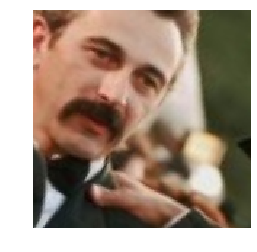

(2,) (2,)


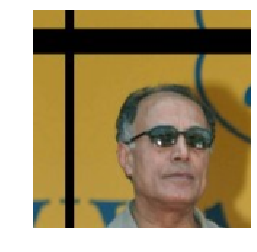

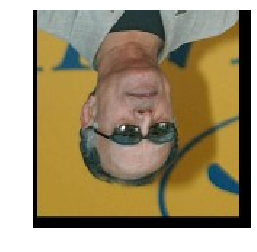

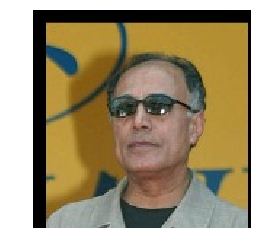

angle:0.6659633866741048


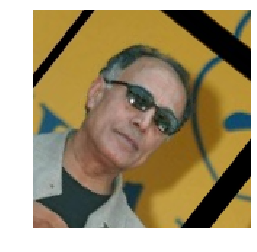

(2,) (2,)


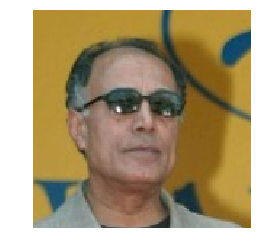

fc:0.22425128352001758


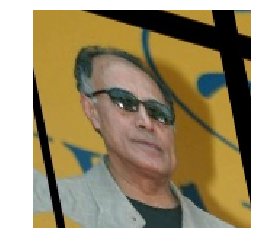

(2,) (2,)


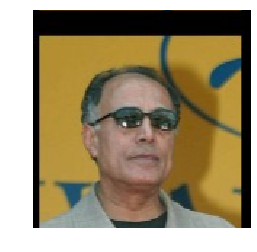

angle:0.5114729851671673


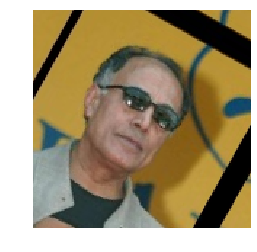

(2,) (2,)


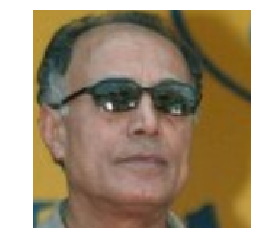

tmp:[[ 1.45433839 -0.79710108  0.00884138]
 [ 0.81631166  1.42011289  0.05955067]
 [ 0.          0.          1.        ]]


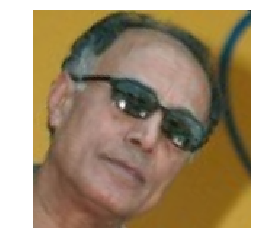

(2,) (2,)


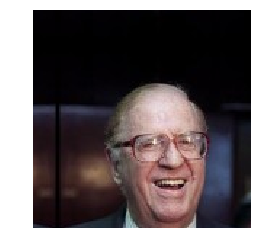

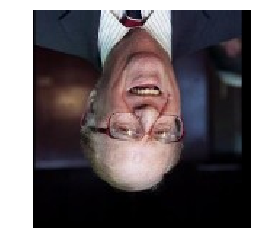

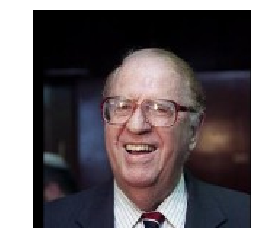

angle:0.6648636572043707


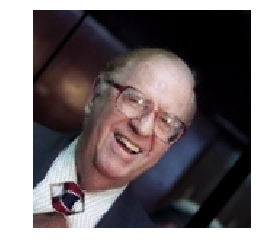

(2,) (2,)


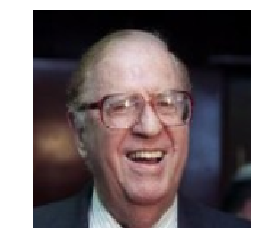

fc:0.2951802420185927


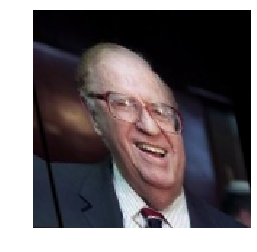

(2,) (2,)


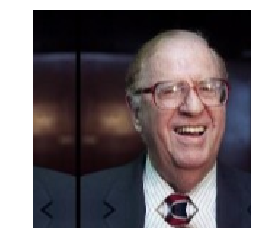

angle:0.565452009296334


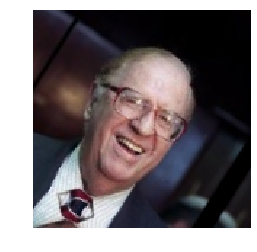

(2,) (2,)


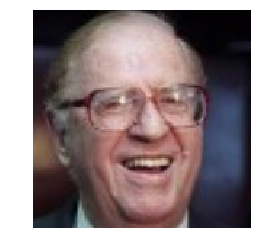

tmp:[[ 1.33299433 -0.81956783  0.20654355]
 [ 0.8458791   1.29153123 -0.08302207]
 [ 0.          0.          1.        ]]


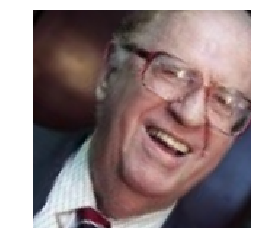

(2,) (2,)


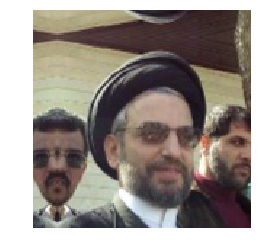

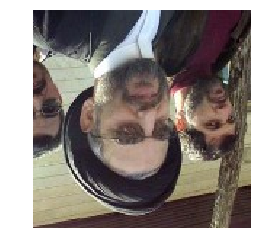

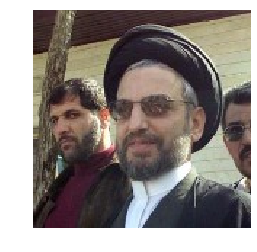

angle:0.5338578255960145


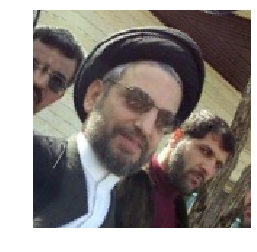

(2,) (2,)


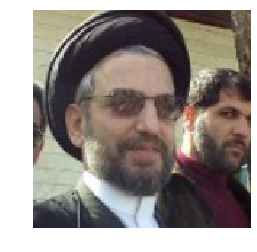

fc:0.269573395704669


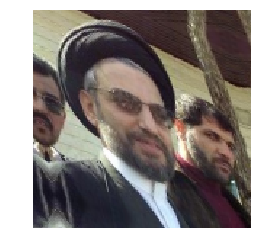

(2,) (2,)


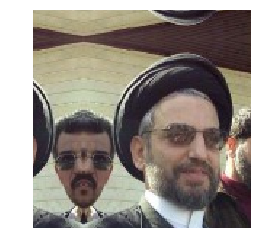

angle:0.5332785201203422


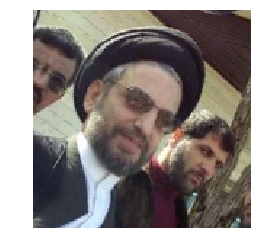

(2,) (2,)


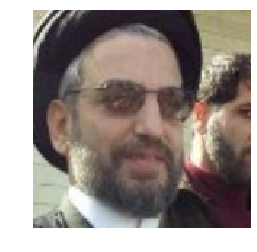

tmp:[[ 1.30913689 -0.81389513  0.23320412]
 [ 0.77282217  1.3787132   0.13241453]
 [ 0.          0.          1.        ]]


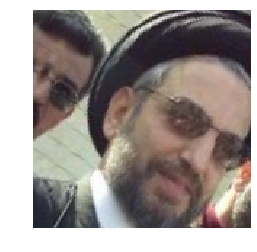

(2,) (2,)


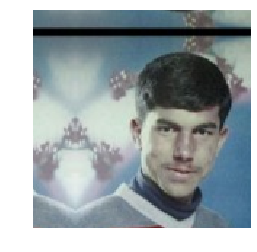

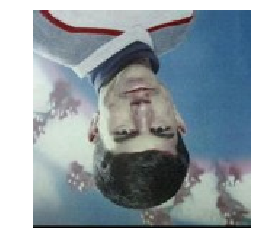

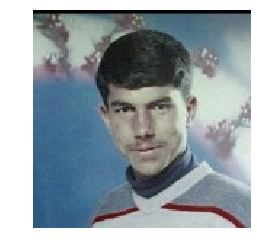

angle:0.6953595187050108


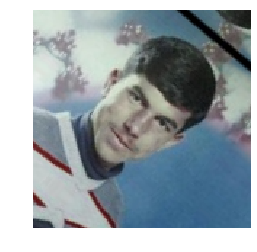

(2,) (2,)


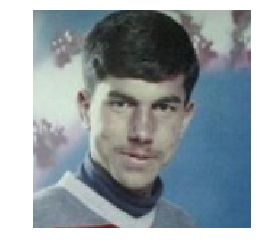

fc:0.28519363539709863


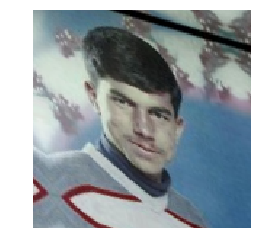

(2,) (2,)


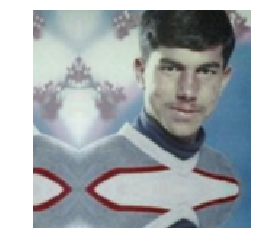

angle:0.7869486019516037


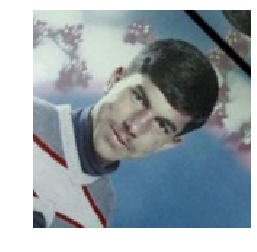

(2,) (2,)


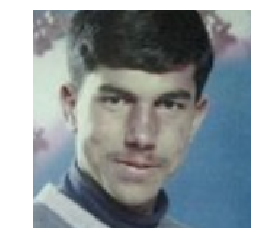

tmp:[[ 1.07309586 -1.08697667  0.21002242]
 [ 1.07642857  1.08361131 -0.17668742]
 [ 0.          0.          1.        ]]


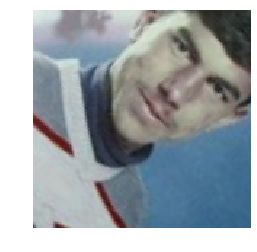

(2,) (2,)


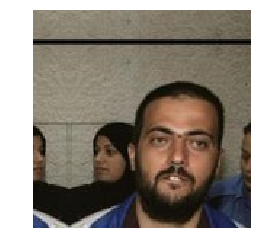

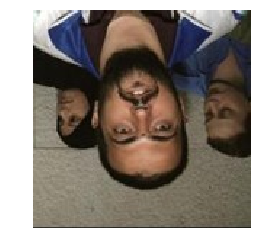

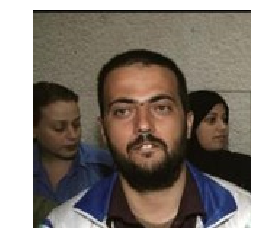

angle:0.5326666041978178


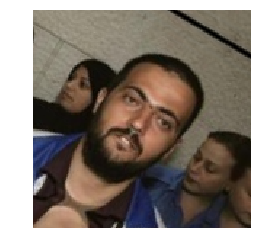

(2,) (2,)


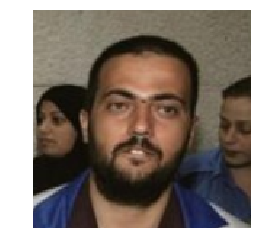

fc:0.21093284350803437


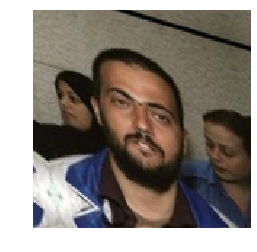

(2,) (2,)


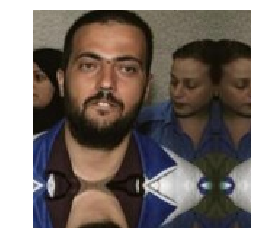

angle:0.7640585430793172


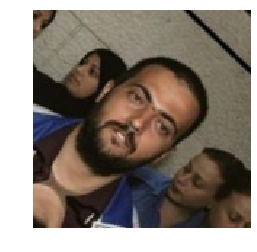

(2,) (2,)


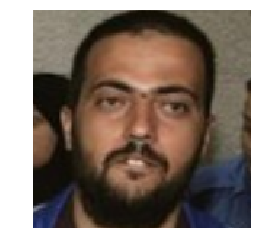

tmp:[[ 1.16088141 -1.09261587 -0.16000473]
 [ 1.11236385  1.14027208 -0.19432461]
 [ 0.          0.          1.        ]]


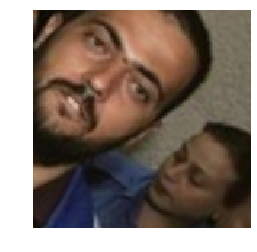

(2,) (2,)


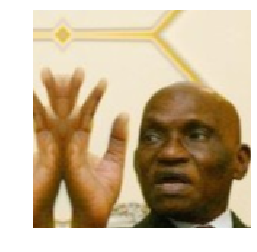

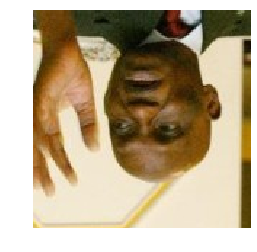

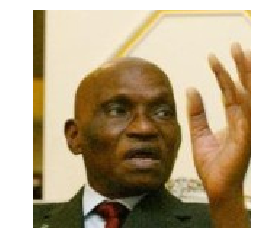

angle:0.7640740416907944


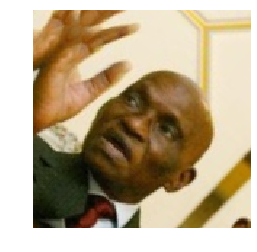

(2,) (2,)


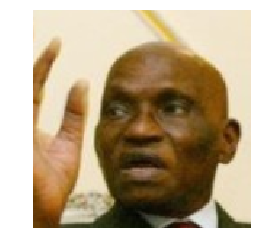

fc:0.20542891220097897


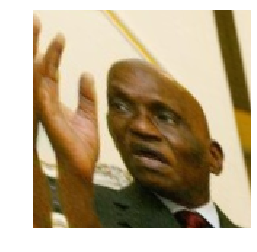

(2,) (2,)


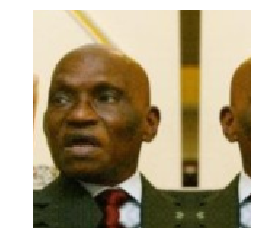

angle:0.6150437209017905


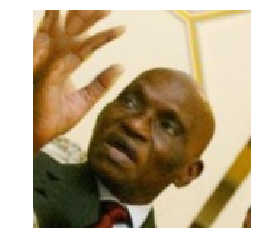

(2,) (2,)


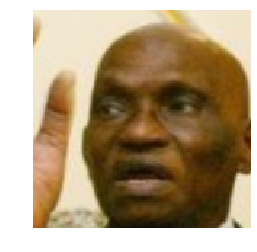

tmp:[[ 1.27358003 -0.88581595 -0.27885624]
 [ 0.89972444  1.25389226 -0.0583721 ]
 [ 0.          0.          1.        ]]


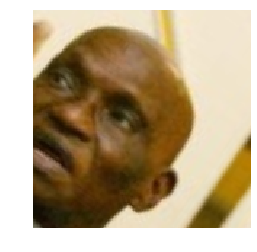

(2,) (2,)


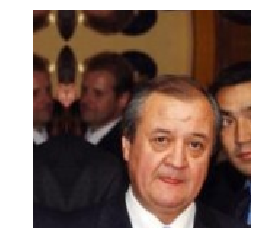

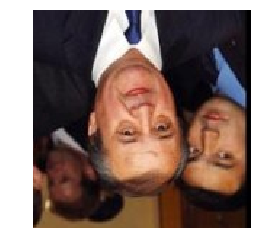

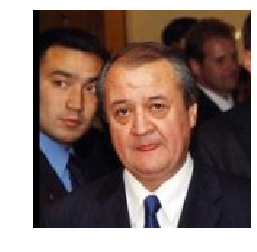

angle:0.6802318859106411


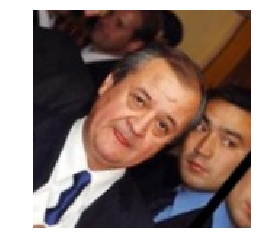

(2,) (2,)


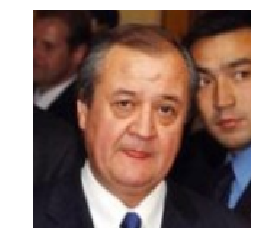

fc:0.21456259513178966


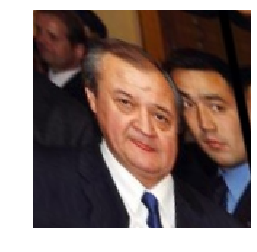

(2,) (2,)


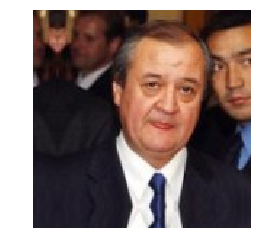

angle:0.5198948712160155


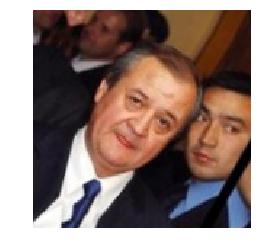

(2,) (2,)


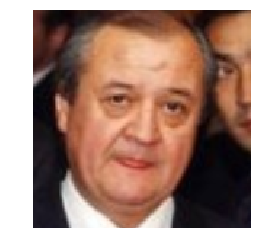

tmp:[[ 1.39405602 -0.77778023  0.11245858]
 [ 0.79798868  1.35875262 -0.10052069]
 [ 0.          0.          1.        ]]


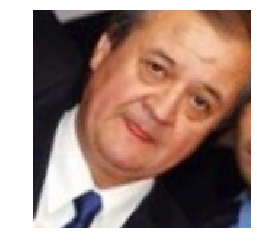

(2,) (2,)


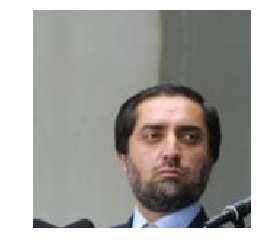

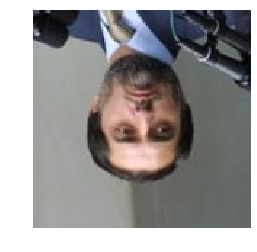

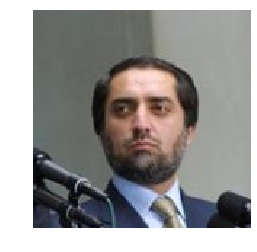

angle:0.7526473034023979


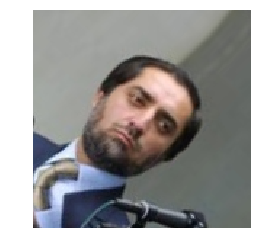

(2,) (2,)


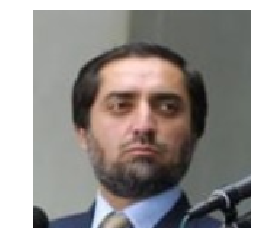

fc:0.2818680598109252


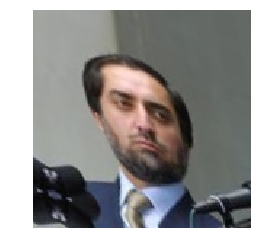

(2,) (2,)


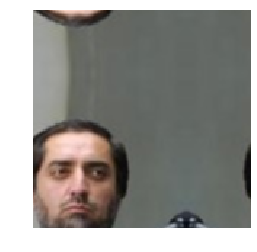

angle:0.5485372607568104


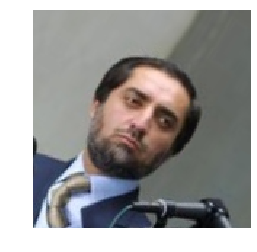

(2,) (2,)


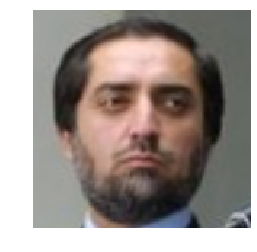

tmp:[[ 1.36707257 -0.83530622 -0.29657481]
 [ 0.83541044  1.36690203  0.29099863]
 [ 0.          0.          1.        ]]


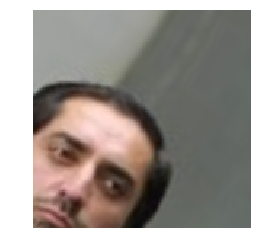

(2,) (2,)


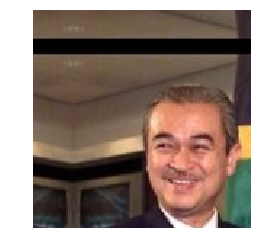

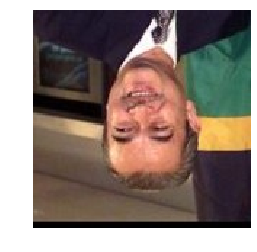

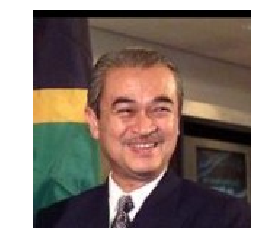

angle:0.753859181478155


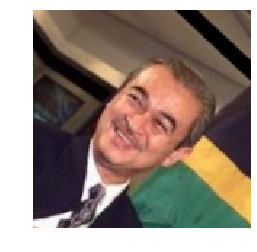

(2,) (2,)


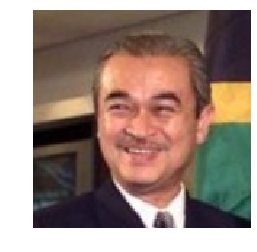

fc:0.21419960279687456


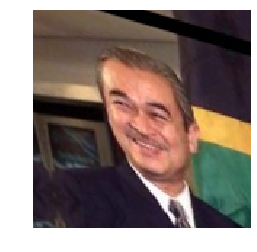

(2,) (2,)


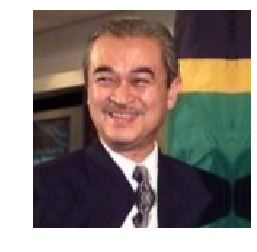

angle:0.6718042755734477


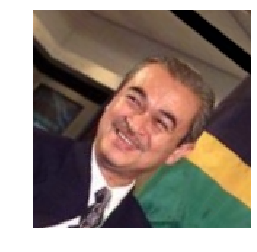

(2,) (2,)


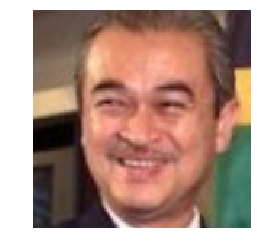

tmp:[[ 1.30990506 -1.04764676 -0.08715415]
 [ 1.04163014  1.31747128 -0.13788136]
 [ 0.          0.          1.        ]]


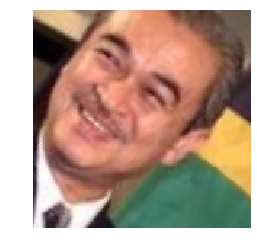

(2,) (2,)


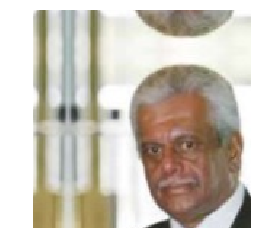

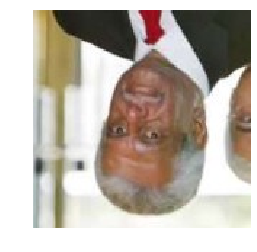

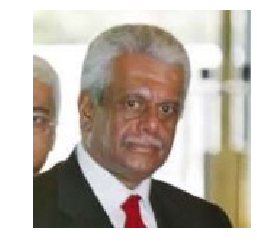

angle:0.730008732818663


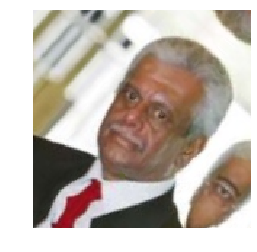

(2,) (2,)


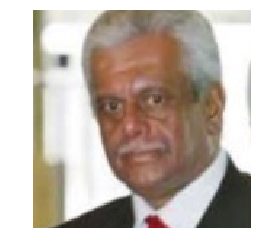

fc:0.2342257461428941


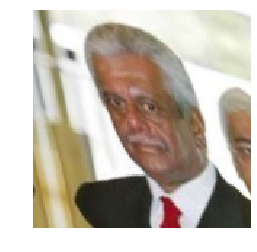

(2,) (2,)


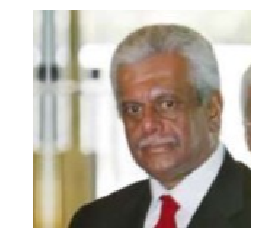

angle:0.796067671716826


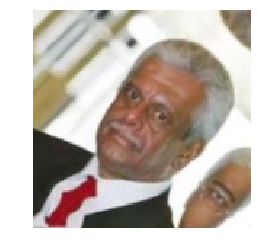

(2,) (2,)


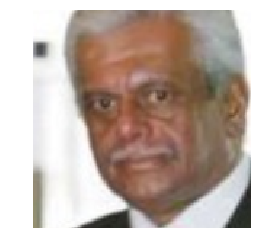

tmp:[[ 1.14185277e+00 -1.09149716e+00  7.03222980e-02]
 [ 1.16648250e+00  1.06845071e+00  6.15348404e-04]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


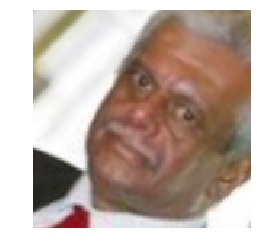

(2,) (2,)


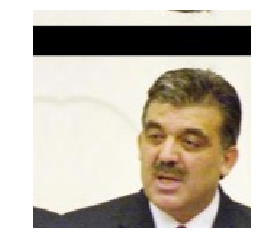

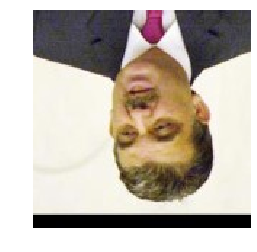

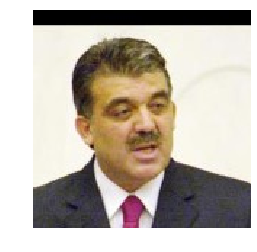

angle:0.755600581170247


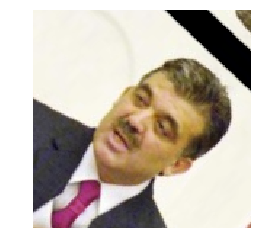

(2,) (2,)


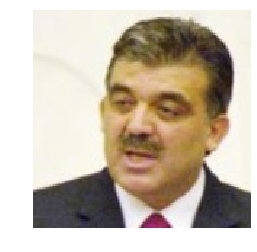

fc:0.25390695545985004


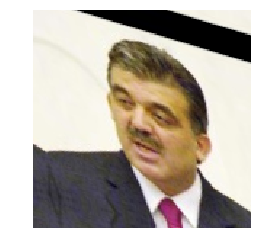

(2,) (2,)


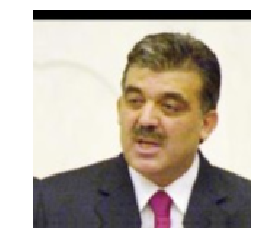

angle:0.6986184326751868


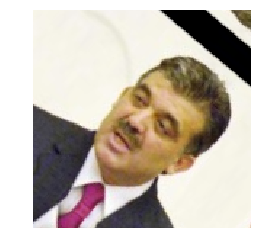

(2,) (2,)


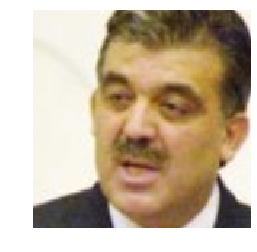

tmp:[[ 1.20434122 -1.05280716  0.03564471]
 [ 1.0115616   1.2534472  -0.02338043]
 [ 0.          0.          1.        ]]


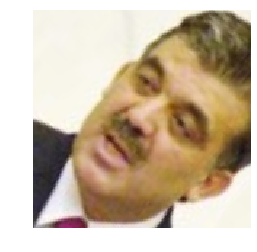

(2,) (2,)


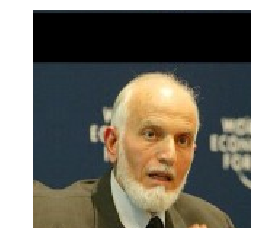

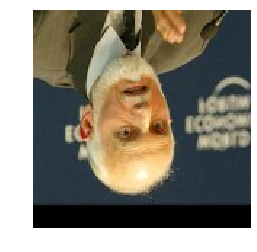

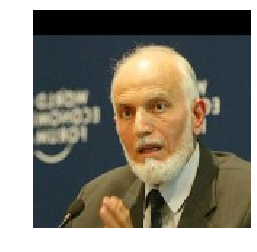

angle:0.7669967112921383


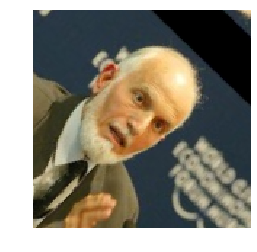

(2,) (2,)


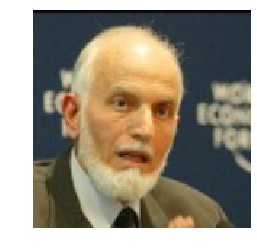

fc:0.25382882610907126


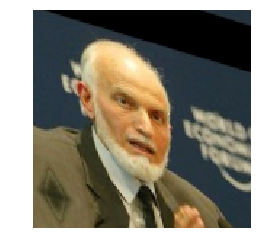

(2,) (2,)


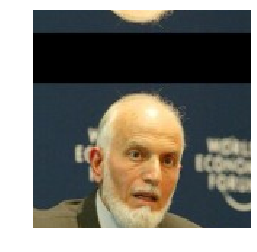

angle:0.6950588473283135


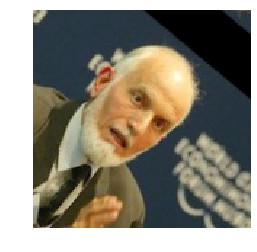

(2,) (2,)


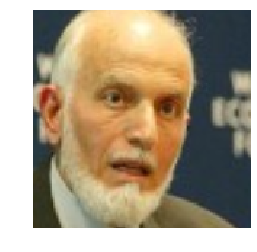

tmp:[[ 1.25300651 -1.06212644  0.04567115]
 [ 1.04485289  1.27372126  0.22020388]
 [ 0.          0.          1.        ]]


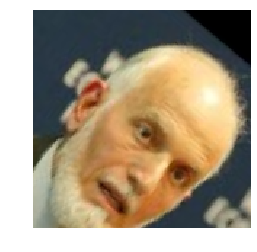

(2,) (2,)


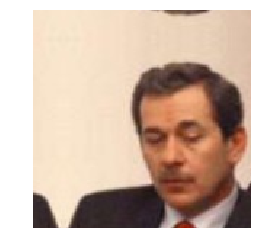

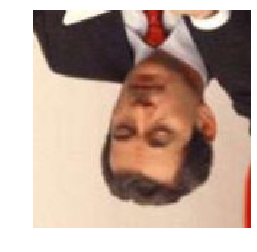

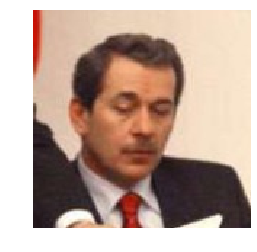

angle:0.6590917888806539


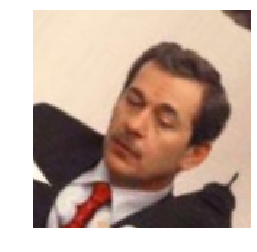

(2,) (2,)


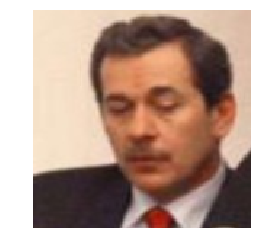

fc:0.21418779454622058


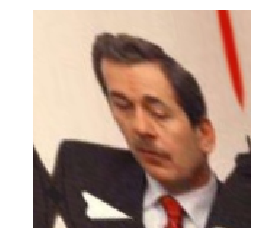

(2,) (2,)


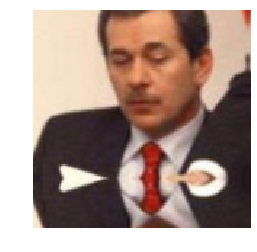

angle:0.7060345753610113


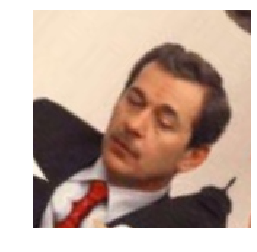

(2,) (2,)


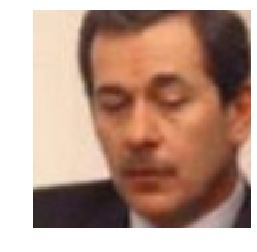

tmp:[[ 1.19090343 -1.06457124 -0.01525173]
 [ 1.01543216  1.24853397 -0.22842378]
 [ 0.          0.          1.        ]]


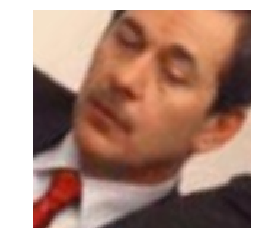

(2,) (2,)


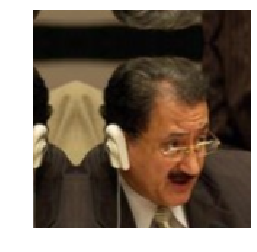

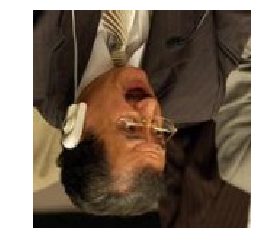

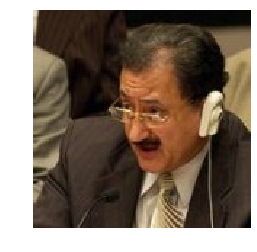

angle:0.504166423137864


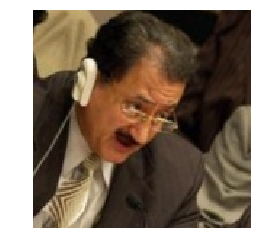

(2,) (2,)


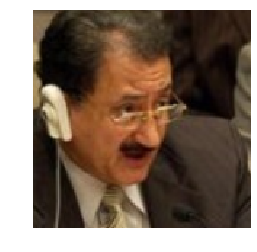

fc:0.22766492325289836


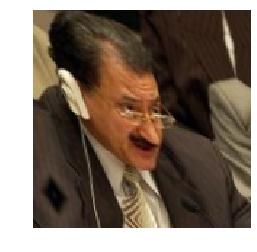

(2,) (2,)


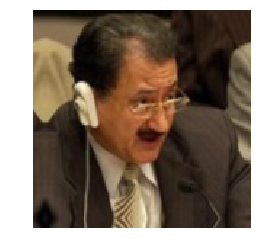

angle:0.6122980153451791


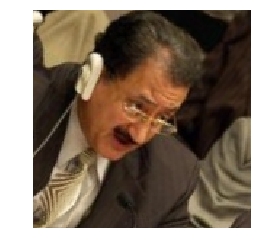

(2,) (2,)


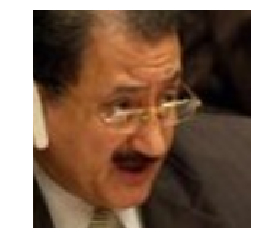

tmp:[[ 1.38137315 -0.95893348  0.0554681 ]
 [ 0.97020044  1.36533123 -0.04444056]
 [ 0.          0.          1.        ]]


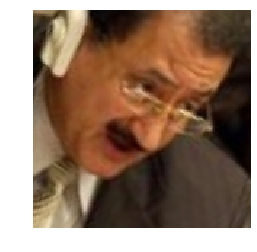

(2,) (2,)


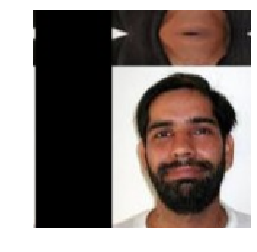

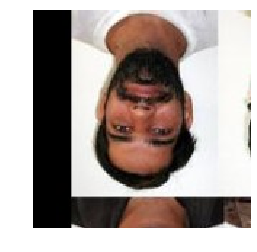

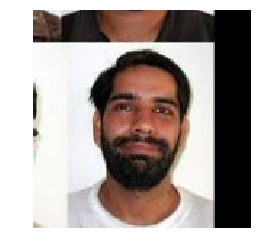

angle:0.6696518776418073


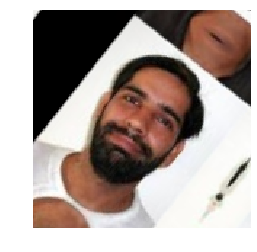

(2,) (2,)


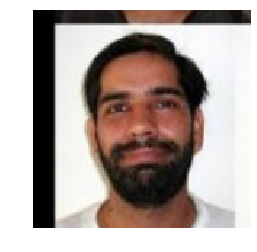

fc:0.2618936338240349


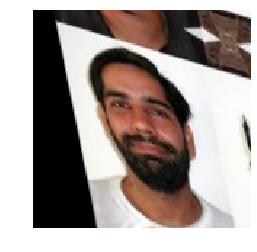

(2,) (2,)


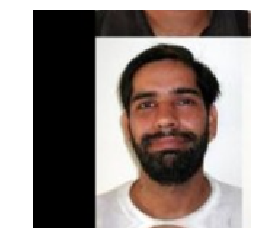

angle:0.6013322895259748


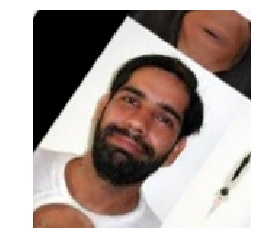

(2,) (2,)


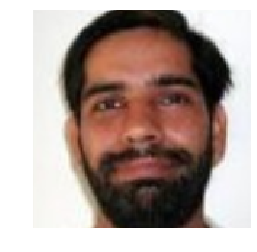

tmp:[[ 1.38295207 -0.94979096  0.1114867 ]
 [ 0.94883574  1.38434433 -0.024989  ]
 [ 0.          0.          1.        ]]


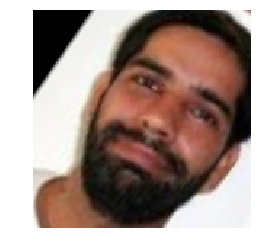

(2,) (2,)


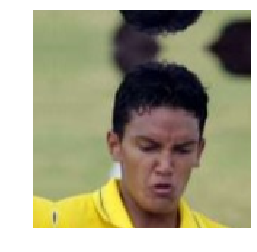

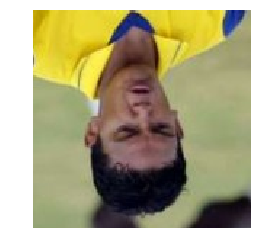

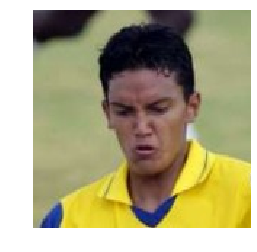

angle:0.5919966647782563


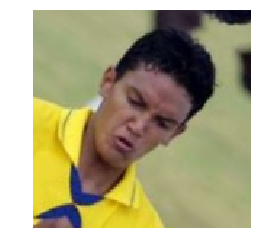

(2,) (2,)


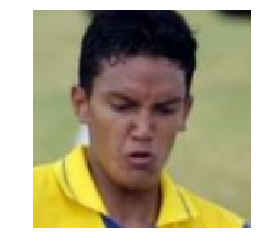

fc:0.2674846365765904


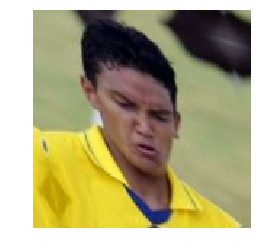

(2,) (2,)


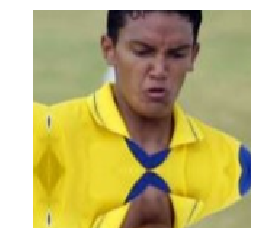

angle:0.7269845588131988


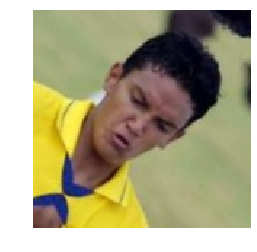

(2,) (2,)


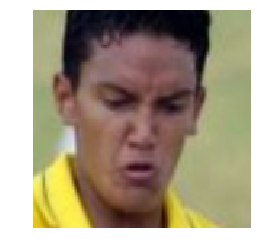

tmp:[[ 1.15658321 -1.12230601  0.07344998]
 [ 1.02878272  1.26172443 -0.26332893]
 [ 0.          0.          1.        ]]


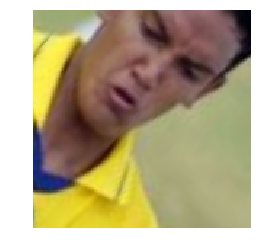

(2,) (2,)


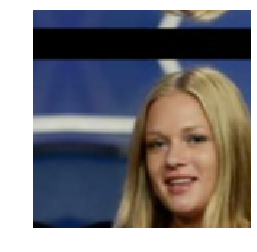

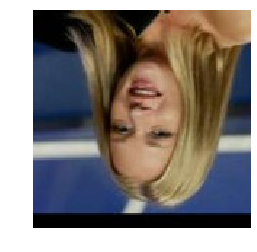

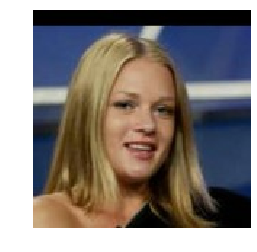

angle:0.5276028909160028


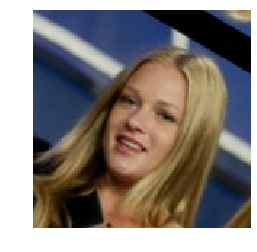

(2,) (2,)


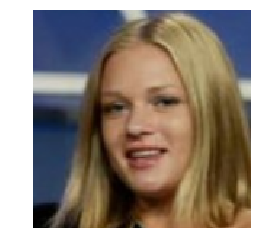

fc:0.26300276601453626


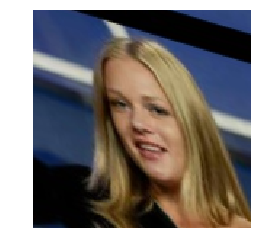

(2,) (2,)


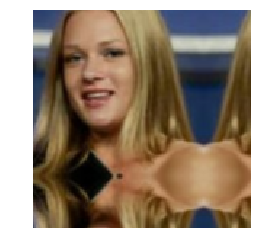

angle:0.6962653406273597


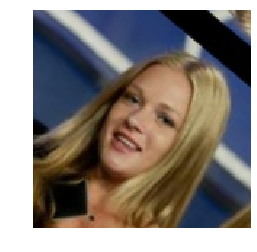

(2,) (2,)


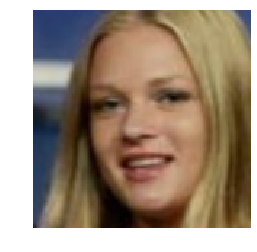

tmp:[[ 1.25753253 -0.99747784 -0.21685975]
 [ 1.05120182  1.19326357 -0.2379854 ]
 [ 0.          0.          1.        ]]


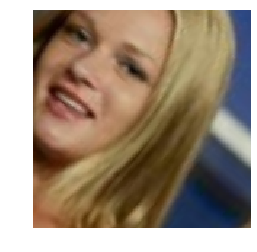

(2,) (2,)


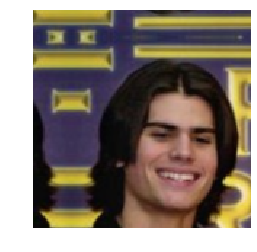

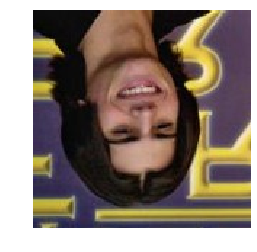

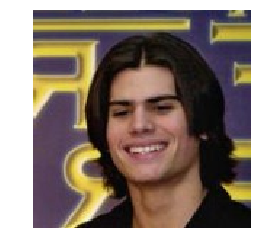

angle:0.5817338611129241


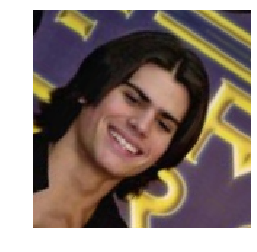

(2,) (2,)


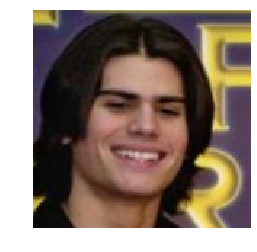

fc:0.2360820627669307


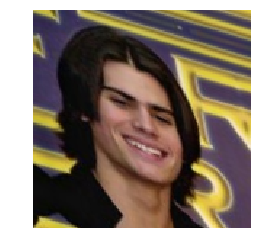

(2,) (2,)


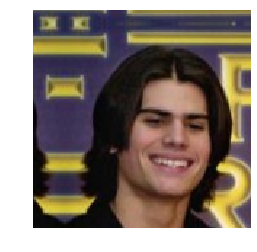

angle:0.6016229483442364


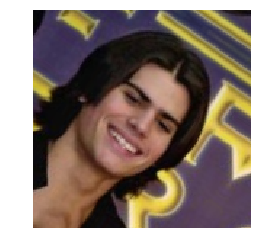

(2,) (2,)


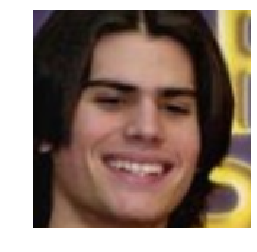

tmp:[[ 1.30955702 -0.91865223  0.14618733]
 [ 0.89903973  1.33812493  0.06179124]
 [ 0.          0.          1.        ]]


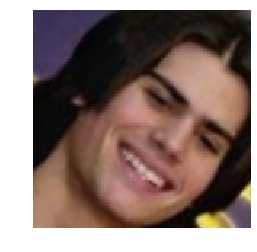

In [2]:
if __name__=="__main__":
    demo = DataAugment(debug=True)
    save_path = './samples'
    imgs = glob.glob('./data\*.jpg')
    i = 0
    for img in imgs:
        img_str = os.path.basename(img)
        bgr_img = cv2.imread(img)
        img = cv2.cvtColor(bgr_img,cv2.COLOR_BGR2RGB)
        
        # 平移测试(倒映填充)
        _,transform = demo.random_transform(img,(0.1,0.1),(0.2,0.2))  #(-0.3,-0.3),(0.3,0.3)
        save_name = save_path + '/' + img_str[:-4] + '(' + 'transform'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(transform,cv2.COLOR_BGR2RGB))
        
        #平移测试
        normal_transform = demo.transform(img,50,25)
        save_name = save_path + '/' + img_str[:-4] + '(' + 'normal_transform'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(normal_transform,cv2.COLOR_BGR2RGB))
        
        #透视变换
        factor1 = [[56,65],[238,52],[28,273],[239,240]]
        factor2 = [[56,65],[238,52],[28,273],[239,240]]
        factor3 = (200,200)
        perspective_transform = demo.perspective_transform(img, factor1, factor2,factor3)
        save_name = save_path + '/' + img_str[:-4] + '(' + 'perspective_transform'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(perspective_transform,cv2.COLOR_BGR2RGB))
        
        
       # 垂直变换测试
        _, flip0 = demo.random_flip(img,(1.0,-1.0))
        save_name = save_path + '/' + img_str[:-4] + '(' + 'flip0'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(flip0,cv2.COLOR_BGR2RGB))

    
        # 水平变换测试
        _, flip1 = demo.random_flip(img, (-1.0, 1.0))
        save_name = save_path + '/' + img_str[:-4] + '(' + 'flip1'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(flip1,cv2.COLOR_BGR2RGB))
   
        #色彩变换
        gray,hsv,yuv,Ycrcb = demo.color_shift(img)
        save_name = save_path + '/' + img_str[:-4] + '(' + 'gray'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(gray,cv2.COLOR_BGR2RGB))
        save_name = save_path + '/' + img_str[:-4] + '(' + 'hsv'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(hsv,cv2.COLOR_BGR2RGB))
        save_name = save_path + '/' + img_str[:-4] + '(' + 'yuv'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(yuv,cv2.COLOR_BGR2RGB))
        save_name = save_path + '/' + img_str[:-4] + '(' + 'Ycrcb'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(Ycrcb,cv2.COLOR_BGR2RGB))
                
    
        # 旋转变换测试
        _, rotate = demo.random_rotate(img,(0.5,0.8))
        save_name = save_path + '/' + img_str[:-4] + '(' + 'rotate'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(rotate,cv2.COLOR_BGR2RGB))

        # 缩放变换测试
        _, scale = demo.random_scale(img,(1.2, 1.2),(1.3,1.3))
        save_name = save_path + '/' + img_str[:-4] + '(' + 'scale'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(scale,cv2.COLOR_BGR2RGB))
        
        # 中心裁剪测试
        crop = demo.center_crop(img,50,50)
        save_name = save_path + '/' + img_str[:-4] + '(' + 'crop'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(crop,cv2.COLOR_BGR2RGB))
        

        # 随机裁剪测试
        _, shear = demo.random_shear(img,(0.2,0.3))
        save_name = save_path + '/' + img_str[:-4] + '(' + 'shear'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(shear,cv2.COLOR_BGR2RGB))

        # 组合变换
        t1,_ = demo.random_transform(img,(-0.3,-0.3),(0.3,0.3))
        t2,_ = demo.random_rotate(img,(0.5,0.8))
        t3,_ = demo.random_scale(img,(1.5,1.5),(1.7,1.7))
        tmp = np.linalg.multi_dot([t1,t2,t3])
        print("tmp:{}".format(tmp))
        combine_transform = demo.apply(img,tmp)
        save_name = save_path + '/' + img_str[:-4] + '(' + 'combine_transform'+ ')' +'.jpg'
        cv2.imwrite(save_name,cv2.cvtColor(combine_transform,cv2.COLOR_BGR2RGB))
